## Cruzamentos Brasileirão

### Imports and Fonts

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import matplotlib.patheffects as path_effects
import matplotlib.font_manager as fm
from matplotlib.patches import RegularPolygon
import matplotlib.patches as mpatches
from matplotlib import cm
import numpy as np
from matplotlib import cm
from highlight_text import fig_text, ax_text
from ast import literal_eval

from mplsoccer import Pitch, VerticalPitch, lines

from PIL import Image
import urllib
import os

import sys
pd.set_option('display.max_columns', None)
sys.path.append('D:/pythonProject/football/Cruzamentos_BR/src/utils/src/utils')

In [4]:
font_path = "D:/pythonProject/football/Cruzamentos_BR/src/utils/fonts"
for x in os.listdir(font_path):
    for y in os.listdir(f"{font_path}/{x}"):
        if (y.split(".")[-1] == "ttf") or (y.split(".")[-1] == "otf"):
            fm.fontManager.addfont(f"{font_path}/{x}/{y}")
            try:
                fm.FontProperties(weight=y.split("-")[-1].split(".")[0].lower(), fname=y.split("-")[0])
            except Exception:
                continue

plt.style.use("D:/pythonProject/football/Cruzamentos_BR/src/utils/stylesheets/soc_base.mplstyle")
plt.rcParams['font.family'] = 'DM Sans'

In [5]:
br_23 = pd.read_json('D:/pythonProject/football/Cruzamentos_BR/data/raw/Brasileirao_2023_match_data.json',encoding='utf-8' )
br_23 = br_23.T
br_23.set_index('matchId', inplace=True)

#

# Código para extrair os dados dos jogadores por jogo

## Extrair os dados

In [7]:
import pandas as pd

event_ids = []
minutes = []
seconds = []
team_ids = []
x_values = []
y_values = []
expanded_minutes = []
periods = []
outcome_types = []
qualifiers_list = []
satisfied_events_types_list = []
is_touches = []
player_ids = []
end_x_values = []
end_y_values = []
blocked_x_values = []
blocked_y_values = []
goal_mouth_z_values = []
goal_mouth_y_values = []
is_shots = []
related_event_ids = []
related_player_ids = []
is_goals = []
card_types = []
event_types = []
match_dates = []
match_ids = []
match_strings = []
is_own_goals = []
player_names = []
pass_recipients = []

for match_id, match_data in br_23['matchCentreData'].items():
    
    if match_data is not None and 'events' in match_data:
        player_id_name_dict = match_data["playerIdNameDictionary"]  # Dicionário de nomes de jogadores para este jogo
        for event_data in match_data['events']:
            event_ids.append(event_data.get('id', None))
            minutes.append(event_data.get('minute', None))
            seconds.append(event_data.get('second', None))
            team_ids.append(event_data.get('teamId', None))
            x_values.append(event_data.get('x', None))
            y_values.append(event_data.get('y', None))
            expanded_minutes.append(event_data.get('expandedMinute', None))
            periods.append(event_data['period']['displayName'] if 'period' in event_data else None)
            outcome_types.append(event_data['outcomeType']['displayName'] if 'outcomeType' in event_data else None)
            qualifiers_list.append(event_data.get('qualifiers', None))
            satisfied_events_types_list.append(event_data.get('satisfiedEventsTypes', None))
            is_touches.append(event_data.get('isTouch', None))
            player_id = event_data.get('playerId', None)
            player_ids.append(player_id)
            end_x_values.append(event_data.get('endX', None))
            end_y_values.append(event_data.get('endY', None))
            blocked_x_values.append(event_data.get('blockedX', None))
            blocked_y_values.append(event_data.get('blockedY', None))
            goal_mouth_z_values.append(event_data.get('goalMouthZ', None))
            goal_mouth_y_values.append(event_data.get('goalMouthY', None))
            is_shots.append(event_data.get('isShot', None))
            related_event_ids.append(event_data.get('relatedEventId', None))
            related_player_id = event_data.get('relatedPlayerId', None)
            related_player_ids.append(related_player_id)
            is_goals.append(event_data.get('isGoal', None))
            card_types.append(event_data['cardType']['displayName'] if 'cardType' in event_data else None)
            event_types.append(event_data['type']['displayName'] if 'type' in event_data else None)
            #team_names.append(event_data['team']['name'] if 'team' in event_data else None)
            match_dates.append(match_data['kickoff']['label'] if 'kickoff' in match_data else None)
            match_ids.append(match_id)
            match_strings.append(match_data['name'] if 'name' in match_data else None)
            is_own_goals.append(event_data.get('isOwnGoal', None))

            # Obtenha o nome do jogador e o pass recipient usando os IDs
            player_names.append(player_id_name_dict.get(str(player_id), None))
            pass_recipients.append(player_id_name_dict.get(str(related_player_id), None))

# Crie um DataFrame com as informações extraídas
df_events = pd.DataFrame({
    'event_id': event_ids,
    'minute': minutes,
    'second': seconds,
    'team_id': team_ids,
    'x': x_values,
    'y': y_values,
    'expanded_minute': expanded_minutes,
    'period': periods,
    'outcome_type': outcome_types,
    'qualifiers': qualifiers_list,
    'satisfied_events_types': satisfied_events_types_list,
    'is_touch': is_touches,
    'player_id': player_ids,
    'end_x': end_x_values,
    'end_y': end_y_values,
    'blocked_x': blocked_x_values,
    'blocked_y': blocked_y_values,
    'goal_mouth_z': goal_mouth_z_values,
    'goal_mouth_y': goal_mouth_y_values,
    'is_shot': is_shots,
    'related_event_id': related_event_ids,
    'related_player_id': related_player_ids,
    'is_goal': is_goals,
    'card_type': card_types,
    'event_type': event_types,
    #'team_name': team_names,
    'match_date': match_dates,
    'match_id': match_ids,
    'match_string': match_strings,
    'is_own_goal': is_own_goals,
    'player_name': player_names,
    'pass_recipient': pass_recipients
})

def format_qualifiers(qualifiers):
    if qualifiers is not None and len(qualifiers) > 0:
        formatted_qualifiers = [
            {item['type']['displayName']: item.get('value', None)}
            for item in qualifiers
        ]
        return formatted_qualifiers
    return None

# Aplicando a função à coluna 'qualifiers'
df_events['qualifiers'] = df_events['qualifiers'].apply(format_qualifiers)
df_events = df_events.dropna(subset=['qualifiers'])

# Exiba o DataFrame
print(df_events)

df_events.to_csv('D:/pythonProject/football/Cruzamentos_BR/data/processed/br_23.csv')


            event_id  minute  second  team_id     x     y  expanded_minute  \
2       2.534093e+09       0     0.0     1218  50.0  50.0                0   
3       2.534093e+09       0     3.0     1218  32.3  38.7                0   
4       2.534093e+09       0     6.0     1218  68.0  64.6                0   
5       2.534093e+09       0     6.0     1243  32.0  35.4                0   
6       2.534093e+09       0     6.0     1218  66.6  66.5                0   
...              ...     ...     ...      ...   ...   ...              ...   
505352  2.562793e+09      98    35.0     1232  30.8  63.4              103   
505353  2.562793e+09      99    13.0     1232   0.0   0.0              104   
505354  2.562793e+09     101    38.0     1235  70.8  34.2              106   
505359  2.562727e+09       0     0.0     1232   0.0   0.0                0   
505360  2.562730e+09       0     0.0     1235   0.0   0.0                0   

            period  outcome_type  \
2        FirstHalf    Succe

In [8]:
data = pd.read_csv('D:/pythonProject/football/Cruzamentos_BR/data/processed/br_23.csv')
data['qualifiers'] = [literal_eval(x) for x in data['qualifiers']]
data['satisfied_events_types'] = [literal_eval(x) for x in data['satisfied_events_types']]
team_map = pd.read_csv('D:/pythonProject/football/Cruzamentos_BR/data/raw/times_br23.csv',delimiter= ';',  encoding='utf-8')

C:\Users\leojo\AppData\Local\Temp\ipykernel_32964\1240163783.py:1: DtypeWarning: Columns (29) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv('D:/pythonProject/football/Cruzamentos_BR/data/processed/br_23.csv')


In [9]:
team_map.head(2)

,fotmob_id,team_name,team_id
0,1757,America MG,1228
1,10273,Athletico Paranaense,1243


In [10]:
data.head(5)

,Unnamed: 0,event_id,minute,second,team_id,x,y,expanded_minute,period,outcome_type,qualifiers,satisfied_events_types,is_touch,player_id,end_x,end_y,blocked_x,blocked_y,goal_mouth_z,goal_mouth_y,is_shot,related_event_id,related_player_id,is_goal,card_type,event_type,match_date,match_id,match_string,is_own_goal,player_name,pass_recipient
0,2,2.534093e+09,0,0.0,1218,50.0,50.0,0,FirstHalf,Successful,"[{'PassEndX': '32.3'}, {'StandingSave': None},...","[91, 117, 30, 35, 38, 215, 218]",True,86566.0,32.3,38.7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Pass,NaN,1716602,NaN,NaN,Vinícius,NaN
1,3,2.534093e+09,0,3.0,1218,32.3,38.7,0,FirstHalf,Successful,"[{'PassEndX': '66.6'}, {'Angle': '0.5'}, {'Lon...","[91, 119, 117, 124, 127, 36, 37, 216, 218]",True,101640.0,66.6,66.5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Pass,NaN,1716602,NaN,NaN,Sidimar,NaN
2,4,2.534093e+09,0,6.0,1218,68.0,64.6,0,FirstHalf,Successful,"[{'OppositeRelatedEvent': '3'}, {'Offensive': ...","[197, 199]",False,337897.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Aerial,NaN,1716602,NaN,NaN,Matheus Peixoto,NaN
3,5,2.534093e+09,0,6.0,1243,32.0,35.4,0,FirstHalf,Unsuccessful,"[{'Zone': 'Back'}, {'OppositeRelatedEvent': '6...","[198, 200]",False,149561.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Aerial,NaN,1716602,NaN,NaN,Pedro Henrique,NaN
4,6,2.534093e+09,0,6.0,1218,66.6,66.5,0,FirstHalf,Unsuccessful,"[{'Length': '10.4'}, {'Angle': '0.5'}, {'PassE...","[91, 120, 29, 139, 36, 37, 217, 218]",True,337897.0,75.3,73.9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Pass,NaN,1716602,NaN,NaN,Matheus Peixoto,NaN


In [11]:

mapa_eventos = {
    0: 'shotSixYardBox',
    1: 'shotPenaltyArea',
    2: 'shotOboxTotal',
    3: 'shotOpenPlay',
    4: 'shotCounter',
    5: 'shotSetPiece',
    6: 'shotDirectCorner',
    7: 'shotOffTarget',
    8: 'shotOnPost',
    9: 'shotOnTarget',
    10: 'shotsTotal',
    11: 'shotBlocked',
    12: 'shotRightFoot',
    13: 'shotLeftFoot',
    14: 'shotHead',
    15: 'shotObp',
    16: 'goalSixYardBox',
    17: 'goalPenaltyArea',
    18: 'goalObox',
    19: 'goalOpenPlay',
    20: 'goalCounter',
    21: 'goalSetPiece',
    22: 'penaltyScored',
    23: 'goalOwn',
    24: 'goalNormal',
    25: 'goalRightFoot',
    26: 'goalLeftFoot',
    27: 'goalHead',
    28: 'goalObp',
    29: 'shortPassInaccurate',
    30: 'shortPassAccurate',
    31: 'passCorner',
    32: 'passCornerAccurate',
    33: 'passCornerInaccurate',
    34: 'passFreekick',
    35: 'passBack',
    36: 'passForward',
    37: 'passLeft',
    38: 'passRight',
    39: 'keyPassLong',
    40: 'keyPassShort',
    41: 'keyPassCross',
    42: 'keyPassCorner',
    43: 'keyPassThroughball',
    44: 'keyPassFreekick',
    45: 'keyPassThrowin',
    46: 'keyPassOther',
    47: 'assistCross',
    48: 'assistCorner',
    49: 'assistThroughball',
    50: 'assistFreekick',
    51: 'assistThrowin',
    52: 'assistOther',
    53: 'dribbleLost',
    54: 'dribbleWon',
    55: 'challengeLost',
    56: 'interceptionWon',
    57: 'clearanceHead',
    58: 'outfielderBlock',
    59: 'passCrossBlockedDefensive',
    60: 'outfielderBlockedPass',
    61: 'offsideGiven',
    62: 'offsideProvoked',
    63: 'foulGiven',
    64: 'foulCommitted',
    65: 'yellowCard',
    66: 'voidYellowCard',
    67: 'secondYellow',
    68: 'redCard',
    69: 'turnover',
    70: 'dispossessed',
    71: 'saveLowLeft',
    72: 'saveHighLeft',
    73: 'saveLowCentre',
    74: 'saveHighCentre',
    75: 'saveLowRight',
    76: 'saveHighRight',
    77: 'saveHands',
    78: 'saveFeet',
    79: 'saveObp',
    80: 'saveSixYardBox',
    81: 'savePenaltyArea',
    82: 'saveObox',
    83: 'keeperDivingSave',
    84: 'standingSave',
    85: 'closeMissHigh',
    86: 'closeMissHighLeft',
    87: 'closeMissHighRight',
    88: 'closeMissLeft',
    89: 'closeMissRight',
    90: 'shotOffTargetInsideBox',
    91: 'touches',
    92: 'assist',
    93: 'ballRecovery',
    94: 'clearanceEffective',
    95: 'clearanceTotal',
    96: 'clearanceOffTheLine',
    97: 'dribbleLastman',
    98: 'errorLeadsToGoal',
    99: 'errorLeadsToShot',
    100: 'intentionalAssist',
    101: 'interceptionAll',
    102: 'interceptionIntheBox',
    103: 'keeperClaimHighLost',
    104: 'keeperClaimHighWon',
    105: 'keeperClaimLost',
    106: 'keeperClaimWon',
    107: 'keeperOneToOneWon',
    108: 'parriedDanger',
    109: 'parriedSafe',
    110: 'collected',
    111: 'keeperPenaltySaved',
    112: 'keeperSaveInTheBox',
    113: 'keeperSaveTotal',
    114: 'keeperSmother',
    115: 'keeperSweeperLost',
    116: 'keeperMissed',
    117: 'passAccurate',
    118: 'passBackZoneInaccurate',
    119: 'passForwardZoneAccurate',
    120: 'passInaccurate',
    121: 'passAccuracy',
    122: 'cornerAwarded',
    123: 'passKey',
    124: 'passChipped',
    125: 'passCrossAccurate',
    126: 'passCrossInaccurate',
    127: 'passLongBallAccurate',
    128: 'passLongBallInaccurate',
    129: 'passThroughBallAccurate',
    130: 'passThroughBallInaccurate',
    131: 'passThroughBallInacurate',
    132: 'passFreekickAccurate',
    133: 'passFreekickInaccurate',
    134: 'penaltyConceded',
    135: 'penaltyMissed',
    136: 'penaltyWon',
    137: 'passRightFoot',
    138: 'passLeftFoot',
    139: 'passHead',
    140: 'sixYardBlock',
    141: 'tackleLastMan',
    142: 'tackleLost',
    143: 'tackleWon',
    144: 'cleanSheetGK',
    145: 'cleanSheetDL',
    146: 'cleanSheetDC',
    147: 'cleanSheetDR',
    148: 'cleanSheetDML',
    149: 'cleanSheetDMC',
    150: 'cleanSheetDMR',
    151: 'cleanSheetML',
    152: 'cleanSheetMC',
    153: 'cleanSheetMR',
    154: 'cleanSheetAML',
    155: 'cleanSheetAMC',
    156: 'cleanSheetAMR',
    157: 'cleanSheetFWL',
    158: 'cleanSheetFW',
    159: 'cleanSheetFWR',
    160: 'cleanSheetSub',
    161: 'goalConcededByTeamGK',
    162: 'goalConcededByTeamDL',
    163: 'goalConcededByTeamDC',
    164: 'goalConcededByTeamDR',
    165: 'goalConcededByTeamDML',
    166: 'goalConcededByTeamDMC',
    167: 'goalConcededByTeamDMR',
    168: 'goalConcededByTeamML',
    169: 'goalConcededByTeamMC',
    170: 'goalConcededByTeamMR',
    171: 'goalConcededByTeamAML',
    172: 'goalConcededByTeamAMC',
    173: 'goalConcededByTeamAMR',
    174: 'goalConcededByTeamFWL',
    175: 'goalConcededByTeamFW',
    176: 'goalConcededByTeamFWR',
    177: 'goalConcededByTeamSub',
    178: 'goalConcededOutsideBoxGoalkeeper',
    179: 'goalScoredByTeamGK',
    180: 'goalScoredByTeamDL',
    181: 'goalScoredByTeamDC',
    182: 'goalScoredByTeamDR',
    183: 'goalScoredByTeamDML',
    184: 'goalScoredByTeamDMC',
    185: 'goalScoredByTeamDMR',
    186: 'goalScoredByTeamML',
    187: 'goalScoredByTeamMC',
    188: 'goalScoredByTeamMR',
    189: 'goalScoredByTeamAML',
    190: 'goalScoredByTeamAMC',
    191: 'goalScoredByTeamAMR',
    192: 'goalScoredByTeamFWL',
    193: 'goalScoredByTeamFW',
    194: 'goalScoredByTeamFWR',
    195: 'goalScoredByTeamSub',
    196: 'aerialSuccess',
    197: 'duelAerialWon',
    198: 'duelAerialLost',
    199: 'offensiveDuel',
    200: 'defensiveDuel',
    201: 'bigChanceMissed',
    202: 'bigChanceScored',
    203: 'bigChanceCreated',
    204: 'overrun',
    205: 'successfulFinalThirdPasses',
    206: 'punches',
    207: 'penaltyShootoutScored',
    208: 'penaltyShootoutMissedOffTarget',
    209: 'penaltyShootoutSaved',
    210: 'penaltyShootoutSavedGK',
    211: 'penaltyShootoutConcededGK',
    212: 'throwIn',
    213: 'subOn',
    214: 'subOff',
    215: 'defensiveThird',
    216: 'midThird',
    217: 'finalThird',
    218: 'pos'
}

# Função para traduzir os eventos
def traduzir_eventos(lista_codigos):
    eventos_traduzidos = [mapa_eventos.get(codigo, 'Evento Desconhecido') for codigo in lista_codigos]
    return eventos_traduzidos

# Criar uma nova coluna 'eventos_traduzidos' no DataFrame
data['eventos_traduzidos'] = data['satisfied_events_types'].apply(traduzir_eventos)
data = data.drop('satisfied_events_types', axis=1)
data = data.rename(columns={'eventos_traduzidos':'satisfied_events_types'})

# Exibir o DataFrame resultante
print(data)


        Unnamed: 0      event_id  minute  second  team_id     x     y  \
0                2  2.534093e+09       0     0.0     1218  50.0  50.0   
1                3  2.534093e+09       0     3.0     1218  32.3  38.7   
2                4  2.534093e+09       0     6.0     1218  68.0  64.6   
3                5  2.534093e+09       0     6.0     1243  32.0  35.4   
4                6  2.534093e+09       0     6.0     1218  66.6  66.5   
...            ...           ...     ...     ...      ...   ...   ...   
463719      505352  2.562793e+09      98    35.0     1232  30.8  63.4   
463720      505353  2.562793e+09      99    13.0     1232   0.0   0.0   
463721      505354  2.562793e+09     101    38.0     1235  70.8  34.2   
463722      505359  2.562727e+09       0     0.0     1232   0.0   0.0   
463723      505360  2.562730e+09       0     0.0     1235   0.0   0.0   

        expanded_minute      period  outcome_type  \
0                     0   FirstHalf    Successful   
1                

Vamos filtrar apenas os cruzamentos

In [12]:
data.head(1)

,Unnamed: 0,event_id,minute,second,team_id,x,y,expanded_minute,period,outcome_type,qualifiers,is_touch,player_id,end_x,end_y,blocked_x,blocked_y,goal_mouth_z,goal_mouth_y,is_shot,related_event_id,related_player_id,is_goal,card_type,event_type,match_date,match_id,match_string,is_own_goal,player_name,pass_recipient,satisfied_events_types
0,2,2.534093e+09,0,0.0,1218,50.0,50.0,0,FirstHalf,Successful,"[{'PassEndX': '32.3'}, {'StandingSave': None},...",True,86566.0,32.3,38.7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Pass,NaN,1716602,NaN,NaN,Vinícius,NaN,"[touches, passAccurate, shortPassAccurate, pas..."


In [13]:
data_crosses = data.copy()
data_crosses['is_cross'] = False
data['is_assist'] = False
for index, row in enumerate(data_crosses['satisfied_events_types']):
    if ('passCrossInaccurate' in row or 'passCrossAccurate' in row) and ('passCorner' not in row):
        data_crosses.at[index, 'is_cross'] = True
        if 'assist' in row:
            data_crosses.at[index, 'is_assist'] = True

C:\Users\leojo\AppData\Local\Temp\ipykernel_32964\1313290212.py:8: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value 'True' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  data_crosses.at[index, 'is_assist'] = True


In [14]:
data_crosses = data_crosses[data_crosses['is_cross']].reset_index(drop=True)
data_crosses = pd.merge(data_crosses, team_map[['team_id', 'fotmob_id','team_name' ]], how='left', on='team_id')
data_crosses

,Unnamed: 0,event_id,minute,second,team_id,x,y,expanded_minute,period,outcome_type,qualifiers,is_touch,player_id,end_x,end_y,blocked_x,blocked_y,goal_mouth_z,goal_mouth_y,is_shot,related_event_id,related_player_id,is_goal,card_type,event_type,match_date,match_id,match_string,is_own_goal,player_name,pass_recipient,satisfied_events_types,is_cross,is_assist,fotmob_id,team_name
0,143,2.534096e+09,8,49.0,1243,76.5,18.5,8,FirstHalf,Unsuccessful,"[{'Zone': 'Center'}, {'PassEndY': '26.5'}, {'L...",True,131458.0,79.5,26.5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Pass,NaN,1716602,NaN,NaN,Léo Cittadini,NaN,"[touches, passLeftFoot, passCrossInaccurate, p...",True,NaN,10273,Athletico Paranaense
1,175,2.534097e+09,10,53.0,1218,91.6,6.0,10,FirstHalf,Unsuccessful,"[{'PassEndX': '90.6'}, {'StandingSave': None},...",True,86566.0,90.6,13.3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Pass,NaN,1716602,NaN,NaN,Vinícius,NaN,"[touches, passRightFoot, passChipped, passCros...",True,NaN,9862,Goias
2,266,2.534099e+09,16,16.0,1243,76.3,12.5,16,FirstHalf,Unsuccessful,"[{'RightFoot': None}, {'PassEndY': '64.5'}, {'...",True,294064.0,93.5,64.5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Pass,NaN,1716602,NaN,NaN,Vitor Bueno,NaN,"[touches, passRightFoot, passChipped, passCros...",True,NaN,10273,Athletico Paranaense
3,366,2.534101e+09,21,23.0,1218,64.5,96.8,21,FirstHalf,Unsuccessful,"[{'LeftFoot': None}, {'Length': '3.7'}, {'Pass...",True,339273.0,66.2,92.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Pass,NaN,1716602,NaN,NaN,Sander,NaN,"[touches, passLeftFoot, passChipped, passCross...",True,NaN,9862,Goias
4,408,2.534102e+09,23,41.0,1218,92.6,16.1,23,FirstHalf,Unsuccessful,"[{'RightFoot': None}, {'Length': '2.6'}, {'Opp...",True,367280.0,92.1,19.9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Pass,NaN,1716602,NaN,NaN,Everton Morelli,NaN,"[touches, passRightFoot, passChipped, passCros...",True,NaN,9862,Goias
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9749,505203,2.562790e+09,85,47.0,1235,70.9,11.4,90,SecondHalf,Unsuccessful,"[{'StandingSave': None}, {'Length': '17.6'}, {...",True,40771.0,81.8,31.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Pass,NaN,1716593,NaN,NaN,Mariano,NaN,"[touches, passRightFoot, passCrossInaccurate, ...",True,NaN,10272,Atletico MG
9750,505211,2.562790e+09,86,8.0,1235,95.6,92.6,91,SecondHalf,Unsuccessful,"[{'Zone': 'Center'}, {'PassEndY': '50.1'}, {'L...",True,280244.0,97.3,50.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Pass,NaN,1716593,NaN,NaN,Patrick,NaN,"[touches, passLeftFoot, passChipped, passCross...",True,NaN,10272,Atletico MG
9751,505227,2.562790e+09,87,33.0,1235,77.4,89.8,92,SecondHalf,Successful,"[{'StandingSave': None}, {'ShotAssist': '13'},...",True,349214.0,87.2,53.6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Pass,NaN,1716593,NaN,NaN,Igor Gomes,NaN,"[touches, passForwardZoneAccurate, passKey, pa...",True,NaN,10272,Atletico MG
9752,505247,2.562791e+09,89,48.0,1232,86.8,8.1,94,SecondHalf,Successful,"[{'Length': '24.1'}, {'PassEndX': '88.5'}, {'C...",True,321846.0,88.5,43.5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Pass,NaN,1716593,NaN,NaN,Lima,NaN,"[touches, passForwardZoneAccurate, passRightFo...",True,NaN,9863,Fluminense


In [15]:
test_df = data_crosses[(data_crosses['team_name'] == 'Palmeiras')]
test_df

,Unnamed: 0,event_id,minute,second,team_id,x,y,expanded_minute,period,outcome_type,qualifiers,is_touch,player_id,end_x,end_y,blocked_x,blocked_y,goal_mouth_z,goal_mouth_y,is_shot,related_event_id,related_player_id,is_goal,card_type,event_type,match_date,match_id,match_string,is_own_goal,player_name,pass_recipient,satisfied_events_types,is_cross,is_assist,fotmob_id,team_name
41,2314,2.568511e+09,43,39.0,1234,73.2,17.3,43,FirstHalf,Unsuccessful,"[{'StandingSave': None}, {'Chipped': None}, {'...",True,318302.0,87.7,44.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Pass,NaN,1716901,NaN,NaN,Artur,NaN,"[touches, passRightFoot, passChipped, passCros...",True,NaN,10283,Palmeiras
45,2528,2.568521e+09,53,16.0,1234,72.6,9.5,57,SecondHalf,Unsuccessful,"[{'Chipped': None}, {'LeftFoot': None}, {'Zone...",True,318302.0,94.7,46.9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Pass,NaN,1716901,NaN,NaN,Artur,NaN,"[touches, passLeftFoot, passChipped, passCross...",True,NaN,10283,Palmeiras
46,2692,2.568526e+09,65,27.0,1234,77.7,88.1,69,SecondHalf,Unsuccessful,"[{'Length': '19.5'}, {'PassEndY': '62.9'}, {'A...",True,408110.0,86.6,62.9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Pass,NaN,1716901,NaN,NaN,José López,NaN,"[touches, passLeftFoot, passCrossInaccurate, p...",True,NaN,10283,Palmeiras
48,2723,2.568526e+09,67,21.0,1234,85.8,10.7,71,SecondHalf,Unsuccessful,"[{'Cross': None}, {'Angle': '1.44'}, {'Zone': ...",True,402213.0,88.0,36.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Pass,NaN,1716901,NaN,NaN,Richard Ríos,NaN,"[touches, passRightFoot, passCrossInaccurate, ...",True,NaN,10283,Palmeiras
49,2752,2.568527e+09,69,36.0,1234,66.1,88.6,73,SecondHalf,Unsuccessful,"[{'Chipped': None}, {'Cross': None}, {'Angle':...",True,422035.0,85.6,48.4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Pass,NaN,1716901,NaN,NaN,Joaquín Piquerez,NaN,"[touches, passLeftFoot, passChipped, passCross...",True,NaN,10283,Palmeiras
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9698,502041,2.589551e+09,89,42.0,1234,66.4,25.2,92,SecondHalf,Successful,"[{'PassEndY': '51.0'}, {'RightFoot': None}, {'...",True,130563.0,87.7,51.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Pass,NaN,1716646,NaN,NaN,Mayke,NaN,"[touches, passForwardZoneAccurate, passKey, pa...",True,NaN,10283,Palmeiras
9699,502052,2.589552e+09,90,45.0,1234,65.0,81.8,93,SecondHalf,Unsuccessful,"[{'Cross': None}, {'Angle': '5.47'}, {'Zone': ...",True,422035.0,89.4,41.8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Pass,NaN,1716646,NaN,NaN,Joaquín Piquerez,NaN,"[touches, passRightFoot, passChipped, passCros...",True,NaN,10283,Palmeiras
9700,502117,2.589553e+09,94,32.0,1234,93.8,89.0,97,SecondHalf,Unsuccessful,"[{'LeftFoot': None}, {'PassEndX': '93.7'}, {'C...",True,317677.0,93.7,53.2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Pass,NaN,1716646,NaN,NaN,Raphael Veiga,NaN,"[touches, passLeftFoot, passChipped, passCross...",True,NaN,10283,Palmeiras
9701,502134,2.589554e+09,95,27.0,1234,96.4,83.4,98,SecondHalf,Unsuccessful,"[{'Cross': None}, {'Zone': 'Center'}, {'Length...",True,422035.0,92.8,45.2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Pass,NaN,1716646,NaN,NaN,Joaquín Piquerez,NaN,"[touches, passLeftFoot, passChipped, passCross...",True,NaN,10283,Palmeiras


###  Visualização

Nosso primeiro exemplo será o Palmeiras, após isto, vamos replicar para os demais times.

(-0.5, 191.5, 191.5, -0.5)

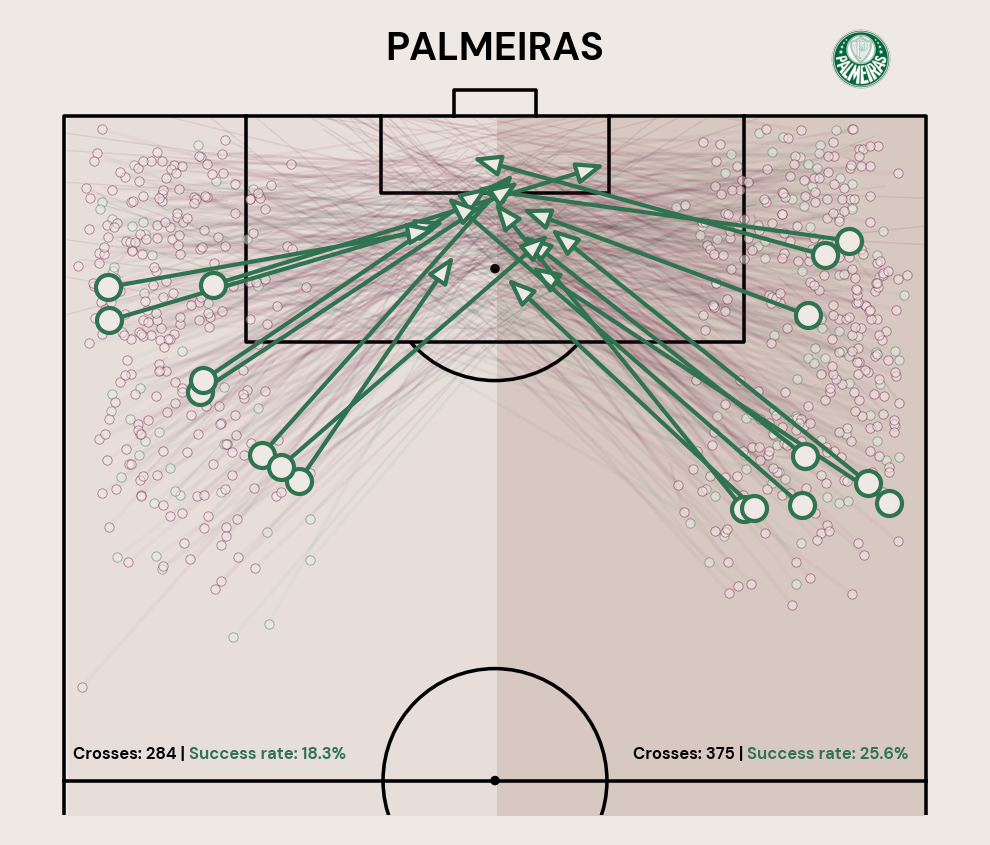

In [16]:
fig = plt.figure(figsize=(4,4), dpi=300)
ax = plt.subplot(111)
pitch = VerticalPitch(
    pitch_type='opta',
    goal_type='box',
    linewidth=.85,
    line_color='black',
    half=True
)
pitch.draw(ax = ax)

# -- Split successful corners from unsuccessful attempts.
assists = test_df[test_df['is_assist'] == True]
others = test_df[test_df['is_assist'] != True]
other_s = test_df[test_df['outcome_type'] == 'Successful']
other_u = test_df[test_df['outcome_type'] != 'Successful']

lines(other_s.y, other_s.x, other_s.end_y, other_s.end_x, 
    ax=ax, comet=True, alpha_start=0.01, alpha_end=0.05, lw=.3, transparent=True, color='#307351')

lines(other_u.y, other_u.x, other_u.end_y, other_u.end_x, 
    ax=ax, comet=True, alpha_start=0.01, alpha_end=0.05, lw=.3, transparent=True, color='#70163C')

for index, a in assists.iterrows():
    # ax.plot([a['y'], a['end_y']], [a['x'], a['end_x']], lw=1, color='#307351')
    pass_arrow = mpatches.FancyArrowPatch((a.y, a.x), (a.end_y, a.end_x), ec='#307351',
                                        fc='#efe9e6',arrowstyle='-|>,head_length=5.6,head_width=2.2', zorder=4)
    ax.add_patch(pass_arrow)

ax.scatter(assists['y'], assists['x'], marker='o', fc=ax.get_facecolor(), ec='#307351', zorder=4)
ax.scatter(other_s['y'], other_s['x'], marker='o', fc=ax.get_facecolor(), ec='#307351', zorder=3, alpha=.5, s=5, lw=0.2)
ax.scatter(other_u['y'], other_u['x'], marker='o', fc=ax.get_facecolor(), ec='#70163C', zorder=3, alpha=.5, s=5, lw=0.2)

# Separate left from right hand side
# -- Count which side had most crosses:
left_side = test_df[test_df['y'] > 50].shape[0]
right_side = test_df[test_df['y'] < 50].shape[0]
left_success = other_s[other_s['y'] > 50].shape[0]
right_success = other_s[other_s['y'] < 50].shape[0]

if right_side > left_side:
    color_left = '#e7deda'
    color_right = '#d7c8c1'
else:
    color_right = '#e7deda'
    color_left = '#d7c8c1'

ax.fill_between(
    x=[0.35,50], y1=ax.get_ylim()[0], y2=99.65,
    color=color_right, zorder=-1
)
ax.fill_between(
    x=[99.35,50], y1=ax.get_ylim()[0], y2=99.65,
    color=color_left, zorder=-1
)

# -- Annotations
ax_text(
    x=99, y=52,
    s=f'Crosses: {left_side:.0f} | <Success rate: {left_success/left_side:.1%}>',
    ha='left', va='center',
    weight='bold', textalign='top',
    highlight_textprops=[{'color':'#307351'}],
    size=4,
    ax=ax
)

ax_text(
    x=34, y=52,
    s=f'Crosses: {right_side:.0f} | <Success rate: {right_success/right_side:.1%}>',
    ha='left', va='center',
    weight='bold', textalign='top',
    highlight_textprops=[{'color':'#307351'}],
    size=4,
    ax=ax
)

ax.annotate(
    xy=(50,105),
    text=f"{test_df['team_name'].iloc[0].upper()}",
    size=9.5,
    color='black',
    ha='center',
    va='center',
    weight='bold',
    annotation_clip=False
)

# -- Add Logo
DC_to_FC = ax.transData.transform
FC_to_NFC = fig.transFigure.inverted().transform
# -- Take data coordinates and transform them to normalized figure coordinates
DC_to_NFC = lambda x: FC_to_NFC(DC_to_FC(x))
ax_coords = DC_to_NFC((11,102))
ax_size = 0.05
image_ax = fig.add_axes(
    [ax_coords[0], ax_coords[1], ax_size, ax_size],
    fc='None'
)
fotmob_url = 'https://images.fotmob.com/image_resources/logo/teamlogo/'
club_icon = Image.open(urllib.request.urlopen(f'{fotmob_url}{test_df["fotmob_id"].iloc[0]:.0f}.png'))
image_ax.imshow(club_icon)
image_ax.axis('off')

Agora transformamos isso em uma função

In [17]:
def plot_crosses_by_team_name(ax, team_name):

    plot_df = data_crosses[(data_crosses['team_name'] == team_name)]

    pitch = VerticalPitch(
        pitch_type='opta',
        goal_type='box',
        linewidth=.85,
        line_color='black',
        half=True
    )
    pitch.draw(ax = ax)

    # -- Split successful corners from unsuccessful attempts.
    assists = plot_df[plot_df['is_assist'] == True]
    others = plot_df[plot_df['is_assist'] != True]
    other_s = plot_df[plot_df['outcome_type'] == 'Successful']
    other_u = plot_df[plot_df['outcome_type'] != 'Successful']

    lines(other_s.y, other_s.x, other_s.end_y, other_s.end_x, 
        ax=ax, comet=True, alpha_start=0.04, alpha_end=0.08, lw=.3, transparent=True, color='#307351')

    lines(other_u.y, other_u.x, other_u.end_y, other_u.end_x, 
        ax=ax, comet=True, alpha_start=0.04, alpha_end=0.08, lw=.3, transparent=True, color='#70163C')

    for index, a in assists.iterrows():
        # ax.plot([a['y'], a['end_y']], [a['x'], a['end_x']], lw=1, color='#307351')
        pass_arrow = mpatches.FancyArrowPatch((a.y, a.x), (a.end_y, a.end_x), ec='#307351',
                                            fc='#efe9e6',arrowstyle='-|>,head_length=5.6,head_width=2.2', zorder=4)
        ax.add_patch(pass_arrow)

    ax.scatter(assists['y'], assists['x'], marker='o', fc=ax.get_facecolor(), ec='#307351', zorder=4)
    ax.scatter(other_s['y'], other_s['x'], marker='o', fc=ax.get_facecolor(), ec='#307351', zorder=3, alpha=.65, s=5, lw=0.2)
    ax.scatter(other_u['y'], other_u['x'], marker='o', fc=ax.get_facecolor(), ec='#70163C', zorder=3, alpha=.65, s=5, lw=0.2)

    # Separate left from right hand side
    # -- Count which side had most crosses:
    left_side = plot_df[plot_df['y'] > 50].shape[0]
    right_side = plot_df[plot_df['y'] < 50].shape[0]
    left_success = other_s[other_s['y'] > 50].shape[0]
    right_success = other_s[other_s['y'] < 50].shape[0]

    if right_side > left_side:
        color_left = '#e7deda'
        color_right = '#d7c8c1'
    else:
        color_right = '#e7deda'
        color_left = '#d7c8c1'

    ax.fill_between(
        x=[0.35,50], y1=ax.get_ylim()[0], y2=99.65,
        color=color_right, zorder=-1
    )
    ax.fill_between(
        x=[99.35,50], y1=ax.get_ylim()[0], y2=99.65,
        color=color_left, zorder=-1
    )

    # -- Annotations
    ax_text(
        x=97, y=55,
        s=f'Crosses: {left_side:.0f}\n<Success (%): {left_success/left_side:.1%}>',
        ha='left', va='center',
        weight='bold', textalign='top',
        highlight_textprops=[{'color':'#307351'}],
        size=6,
        ax=ax
    )

    ax_text(
        x=36, y=55,
        s=f'Crosses: {right_side:.0f}\n<Success (%): {right_success/right_side:.1%}>',
        ha='left', va='center',
        weight='bold', textalign='top',
        highlight_textprops=[{'color':'#307351'}],
        size=7,
        ax=ax
    )

    ax.annotate(
        xy=(50,108),
        text=f"{plot_df['team_name'].iloc[0].upper()}",
        size=11.5,
        color='black',
        ha='center',
        va='center',
        weight='bold',
        annotation_clip=False
    )

    return ax

Finalmente, ordenamos as equipes pelo número total de cruzamentos tentados.

In [18]:
order_teams = data_crosses.groupby(['team_name', 'fotmob_id'])['is_cross'].sum().reset_index().sort_values(by='is_cross', ascending=False).reset_index(drop=True)
order_teams

,team_name,fotmob_id,is_cross
0,Palmeiras,10283,659
1,Cuiaba,197815,618
2,Vasco da Gama,10276,593
3,Red Bull Bragantino,109705,562
4,Cruzeiro,9781,536
5,America MG,1757,519
6,Fluminense,9863,505
7,Santos FC,8514,500
8,Fortaleza,8287,494
9,Bahia,7877,481


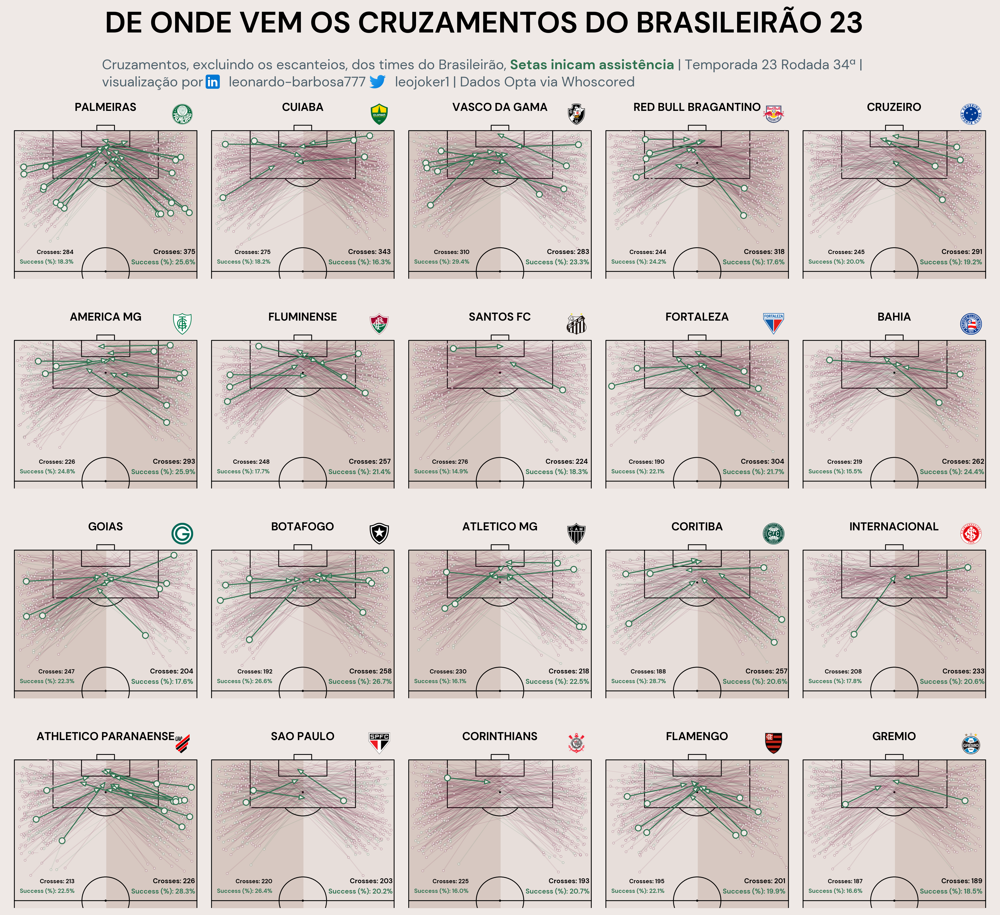

In [37]:
fig, axs = plt.subplots(nrows=4, ncols=5, figsize=(18,18), dpi=300)
axs = np.array(axs)
for index, ax in enumerate(axs.reshape(-1)):
    plot_crosses_by_team_name(ax, order_teams['team_name'].iloc[index])

plt.subplots_adjust(wspace=0, hspace=-.4)
# We add the logos once we've reshaped the figure
for index, ax in enumerate(axs.reshape(-1)):
    # -- Transformation functions
    DC_to_FC = ax.transData.transform
    FC_to_NFC = fig.transFigure.inverted().transform
    # -- Take data coordinates and transform them to normalized figure coordinates
    DC_to_NFC = lambda x: FC_to_NFC(DC_to_FC(x))
    ax_coords = DC_to_NFC((14,87))
    ax_size = 0.017
    image_ax = fig.add_axes(
        [ax_coords[0], ax_coords[1], ax_size, ax_size],
        fc='None'
    )
    fotmob_url = 'https://images.fotmob.com/image_resources/logo/teamlogo/'
    club_icon = Image.open(urllib.request.urlopen(f'{fotmob_url}{order_teams["fotmob_id"].iloc[index]:.0f}.png'))
    image_ax.imshow(club_icon)
    image_ax.axis('off')


fig_text(
    x = 0.5, y = .87, 
    s = "DE ONDE VEM OS CRUZAMENTOS DO BRASILEIRÃO 23",
    va = "bottom", ha = "center",
    fontsize = 30, color = "black", font = "DM Sans", weight = "bold"
)
fig_text(
	x = 0.5, y = .83, 
    s = "Cruzamentos, excluindo os escanteios, dos times do Brasileirão, <Setas inicam assistência> | Temporada 23 Rodada 34ª | \nvisualização por       leonardo-barbosa777        leojoker1 | Dados Opta via Whoscored",
    highlight_textprops=[{"weight": "bold", "color": "#307351"}],
	va = "bottom", ha = "center",
	fontsize = 14, color = "#4E616C", font = "DM Sans"
)
# Adicione o ícone do Twitter
twitter_icon_path = "D:/pythonProject/football/Cruzamentos_BR/src/images/x.png"  
twitter_icon = Image.open(twitter_icon_path)
n_size = (80,80)
twitter_icon = twitter_icon.resize(n_size)
fig.figimage(twitter_icon, xo=1563, yo=3500, origin='upper')


# Adicione o ícone do linkedin
linkedin_icon_path = "D:/pythonProject/football/Cruzamentos_BR/src/images/linkedin.png"  
linkedin_icon = Image.open(linkedin_icon_path)
n_size = (80,80)
linkedin_icon = linkedin_icon.resize(n_size)
fig.figimage(linkedin_icon, xo=865, yo=3500, origin='upper')



plt.savefig(
	"D:/pythonProject/football/Cruzamentos_BR/src/images/cross_br23.png",
	dpi = 600,
	facecolor = "#EFE9E6",
	bbox_inches="tight",
    edgecolor="none",
	transparent = False
)

plt.savefig(
	"D:/pythonProject/football/Cruzamentos_BR/src/images/cross_br23_tr.png",
	dpi = 600,
	facecolor = "none",
	bbox_inches="tight",
    edgecolor="none",
	transparent = True
)